In [1]:
import torch
import torch.nn as nn
from PIL import Image
import torchvision.transforms as transforms
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import os
import numpy as np

In [2]:
class SRCNN(nn.Module):
    def __init__(self, num_channels = 1):
        super(SRCNN, self).__init__()
        self.conv1 = nn.Conv2d(num_channels, 64, kernel_size = 9, padding = 9//2)
        self.conv2 = nn.Conv2d(64, 32, kernel_size = 5, padding = 5//2)
        self.conv3 = nn.Conv2d(32, num_channels, kernel_size = 5, padding = 5//2)
        self.relu = nn.ReLU(inplace = True)
        
    def forward(self, x):
        x = self.relu(self.conv1(x))
        x = self.relu(self.conv2(x))
        x = self.conv3(x)
        return x

In [3]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model_SRCNN = SRCNN().to(device)
model_SRCNN.eval()

SRCNN(
  (conv1): Conv2d(1, 64, kernel_size=(9, 9), stride=(1, 1), padding=(4, 4))
  (conv2): Conv2d(64, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (conv3): Conv2d(32, 1, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (relu): ReLU(inplace=True)
)

In [4]:
#Helper Functions
def load_images(image_path):
    img = Image.open(image_path).convert('YCbCr')
    y, cb , cr = img.split()
    return y, cb, cr

def preprocess_image(img):
    img = transforms.ToTensor()(img)
    img = img.unsqueeze(0)
    return img

def postprocess_image(tensor):
    tensor = tensor.squeeze(0)
    tensor = tensor.clamp(0, 1)
    img = transforms.ToPILImage()(tensor)
    return img

def denormalize(tensor):
    return tensor.mul(0.5).add(0.5).clamp(0, 1)

def upscale_image(model, low_res_image):
    y, cb, cr = low_res_image
    y = preprocess_image(y).to(device)
    
    with torch.no_grad():
        y_upscaled = model(y).squeeze(0).cpu()
    
    y_upscaled = transforms.ToPILImage()(y_upscaled)
    cb_upscaled = cb.resize(y_upscaled.size, Image.BICUBIC)
    cr_upscaled = cr.resize(y_upscaled.size, Image.BICUBIC)
    
    upscaled_image = Image.merge('YCbCr', [y_upscaled, cb_upscaled, cr_upscaled]).convert('RGB')
    return upscaled_image

def save_image(img, path):
    img.save(path)

In [5]:
def display_images(low_res_path, high_res_path, upscaled_path):
    low_res_img = Image.open(low_res_path).convert('RGB')
    high_res_img = Image.open(high_res_path).convert('RGB')
    upscaled_img = Image.open(upscaled_path).convert('RGB')
    
    plt.figure(figsize=(18, 6))
    
    plt.subplot(1, 3, 1)
    plt.title('Low Resolution')
    plt.imshow(low_res_img)
    
    plt.subplot(1, 3, 2)
    plt.title('High Resolution')
    plt.imshow(high_res_img)
    
    plt.subplot(1, 3, 3)
    plt.title('Upscaled')
    plt.imshow(upscaled_img)
    
    plt.show()

In [28]:
def process_and_display_image(model, low_res_dir, high_res_dir, output_dir, num_images_to_process = 6):
    os.makedirs(output_dir, exist_ok = True)
    processed_count = 0
    
    for img_name in os.listdir(low_res_dir):
        if processed_count >= num_images_to_process:
            break

        low_res_path = os.path.join(low_res_dir, img_name)
        high_res_path = os.path.join(high_res_dir, img_name)

        y, cb, cr = load_images(low_res_path)
        upscaled_img = upscale_image(model,  (y, cb, cr))

        save_path = os.path.join(output_dir, img_name)
        save_image(upscaled_img, save_path)

        print(f"Processed {img_name}")
        processed_count += 1


        display_images(low_res_path, high_res_path, save_path)

In [7]:
# Directory paths
val_low_res_dir = '/kaggle/input/image-super-resolution/dataset/val/low_res'
val_high_res_dir = '/kaggle/input/image-super-resolution/dataset/val/high_res'
output_dir = '/kaggle/working/upscaled_images'

os.makedirs(output_dir, exist_ok=True)

In [8]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
from PIL import Image
import os
import numpy as np

class ImageDataset(Dataset):
    def __init__(self, low_res_dir, high_res_dir, transform = None):
        self.low_res_dir = low_res_dir
        self.high_res_dir = high_res_dir
        self.low_res_images = os.listdir(low_res_dir)
        self.high_res_images = os.listdir(high_res_dir)
        self.transform = transform
        
    def __len__(self):
        return len(self.low_res_images)
    
    def __getitem__(self, idx):
        low_res_image_path = os.path.join(self.low_res_dir, self.low_res_images[idx])
        high_res_image_path = os.path.join(self.high_res_dir, self.high_res_images[idx])
        
        low_res_image = Image.open(low_res_image_path).convert('YCbCr')
        high_res_image = Image.open(high_res_image_path).convert('YCbCr')
        
        y_low, cb_low, cr_low = low_res_image.split()
        y_high, cb_high, cr_high = high_res_image.split()
        
        if self.transform:
            y_low = self.transform(y_low)
            y_high = self.transform(y_high)
            cb_low = self.transform(cb_low)
            cr_low = self.transform(cr_low)
            cb_high = self.transform(cb_high)
            cr_high = self.transform(cr_high)

        return y_low, y_high, cb_low, cr_low, cb_high, cr_high

transform = transforms.Compose([
    transforms.ToTensor()
])
            
        

In [9]:
train_dataset = ImageDataset('/kaggle/input/image-super-resolution/dataset/train/low_res', '/kaggle/input/image-super-resolution/dataset/train/high_res', transform=transform)
trainDataLoader = DataLoader(train_dataset, batch_size = 8, shuffle = True)

val_dataset = ImageDataset('/kaggle/input/image-super-resolution/dataset/val/low_res', '/kaggle/input/image-super-resolution/dataset/val/high_res', transform=transform)
valDataLoader = DataLoader(val_dataset, batch_size = 8, shuffle = True)

In [10]:
import numpy as np
from PIL import Image


def denormalize(y, cb, cr):
    y = y.squeeze(0).numpy()
    y = np.clip(y*255, 0, 255).astype(np.uint8)
    
    cb = cb.squeeze(0).numpy()
    cb = np.clip(cb * 255, 0, 255).astype(np.uint8)
    
    cr = cr.squeeze(0).numpy()
    cr = np.clip(cr * 255, 0, 255).astype(np.uint8)
    
    y_img = Image.fromarray(y, mode='L')
    cb_img = Image.fromarray(cb, mode='L')
    cr_img = Image.fromarray(cr, mode='L')
    
    ycbcr_img = Image.merge('YCbCr', (y_img, cb_img, cr_img))
    rgb_img = ycbcr_img.convert('RGB')
    return rgb_img

In [11]:
import matplotlib.pyplot as plt


def test_dataloader(dataloader, dataloader_name):
    print(f"Testing {dataloader_name}: ")
    for i, (y_low, y_high, cb_low, cr_low, cb_high, cr_high) in enumerate(dataloader):
        if i == 1:
            break
        for j in range(y_low.size(0)):
            print(f"Shape of y_low[{j}]: {y_low[j].shape}")
            print(f"Shape of y_high[{j}]: {y_high[j].shape}")
            
            low_res_img = denormalize(y_low[j], cb_low[j], cr_low[j])
            high_res_img = denormalize(y_high[j], cb_high[j], cr_high[j])
            
            plt.figure(figsize=((12, 6)))
            plt.subplot(1, 2, 1)
            plt.title('Low Resolution')
            plt.imshow(low_res_img)

            plt.subplot(1, 2, 2)
            plt.title('High Resolution')
            plt.imshow(high_res_img)

            plt.show()

Testing train_loader: 
Shape of y_low[0]: torch.Size([1, 256, 256])
Shape of y_high[0]: torch.Size([1, 256, 256])


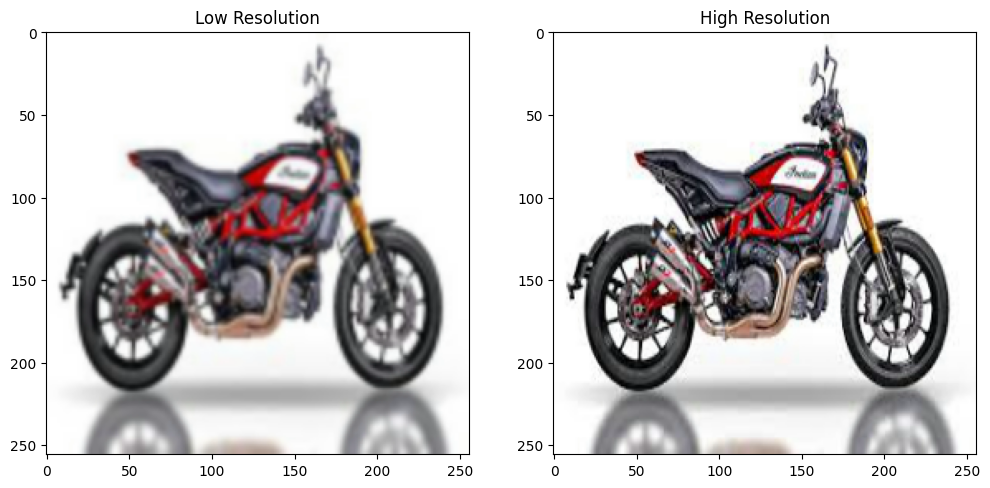

Shape of y_low[1]: torch.Size([1, 256, 256])
Shape of y_high[1]: torch.Size([1, 256, 256])


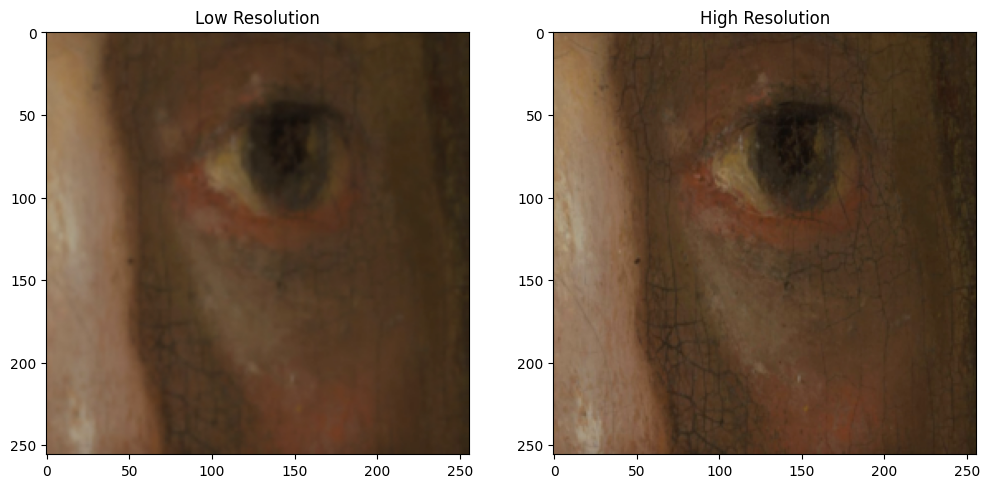

Shape of y_low[2]: torch.Size([1, 256, 256])
Shape of y_high[2]: torch.Size([1, 256, 256])


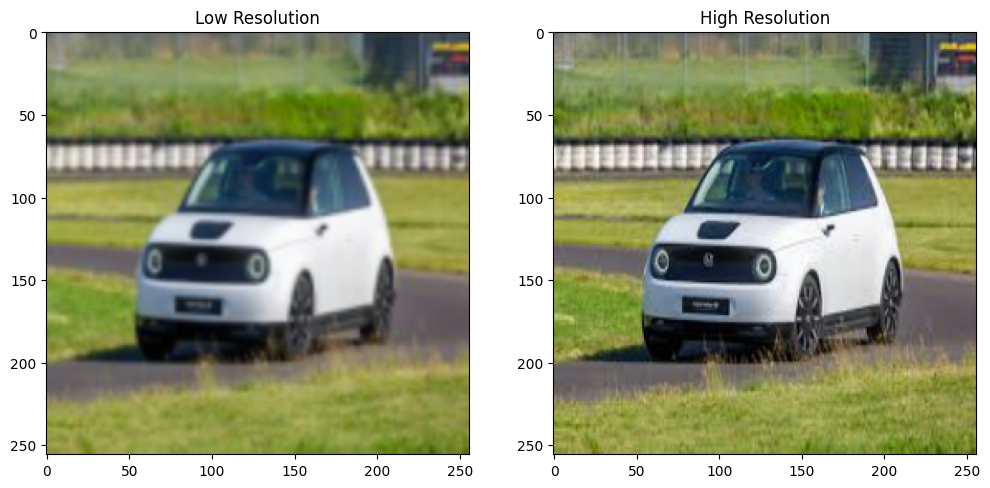

Shape of y_low[3]: torch.Size([1, 256, 256])
Shape of y_high[3]: torch.Size([1, 256, 256])


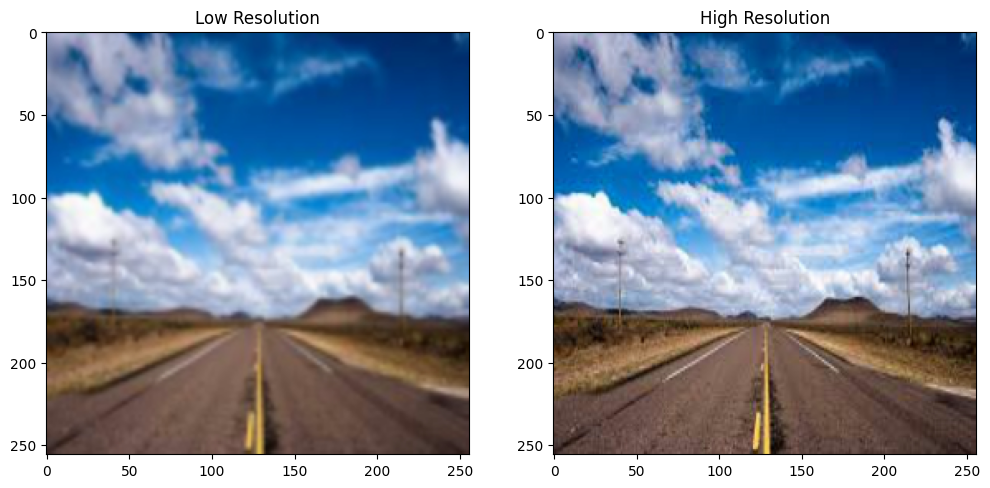

Shape of y_low[4]: torch.Size([1, 256, 256])
Shape of y_high[4]: torch.Size([1, 256, 256])


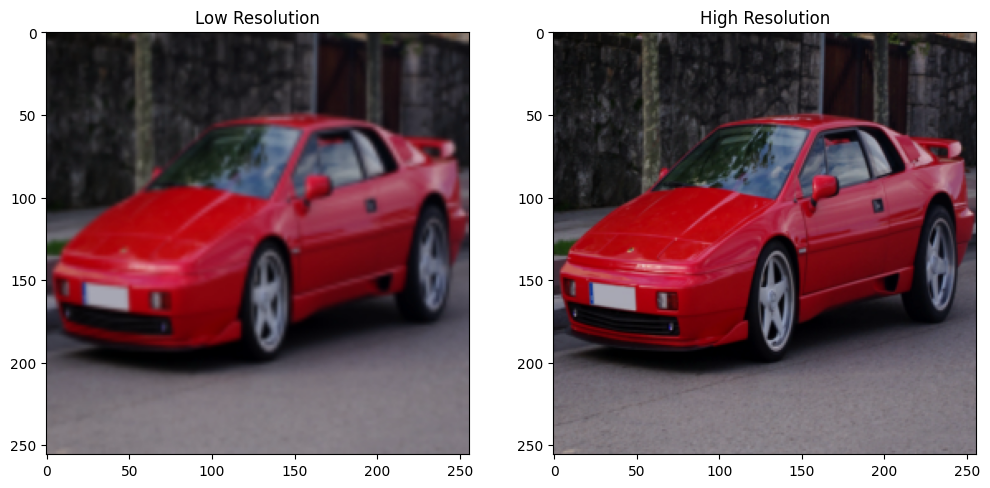

Shape of y_low[5]: torch.Size([1, 256, 256])
Shape of y_high[5]: torch.Size([1, 256, 256])


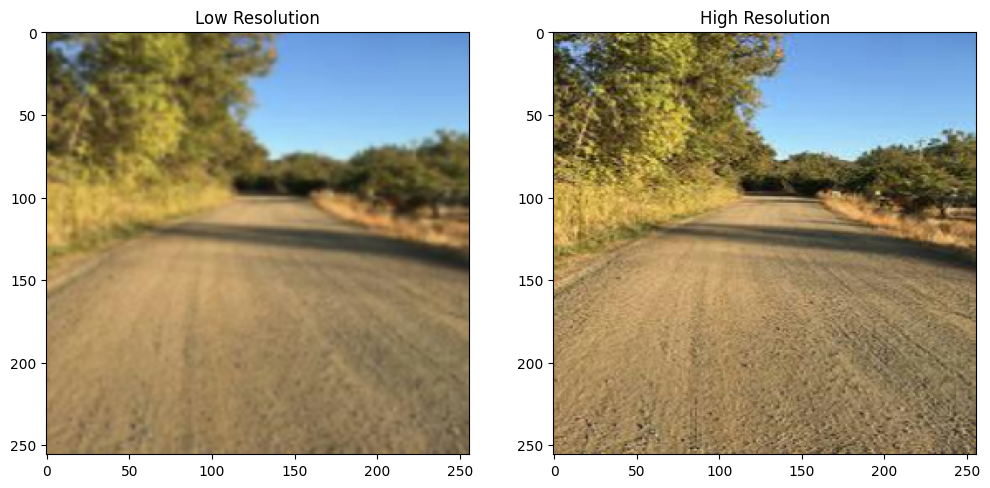

Shape of y_low[6]: torch.Size([1, 256, 256])
Shape of y_high[6]: torch.Size([1, 256, 256])


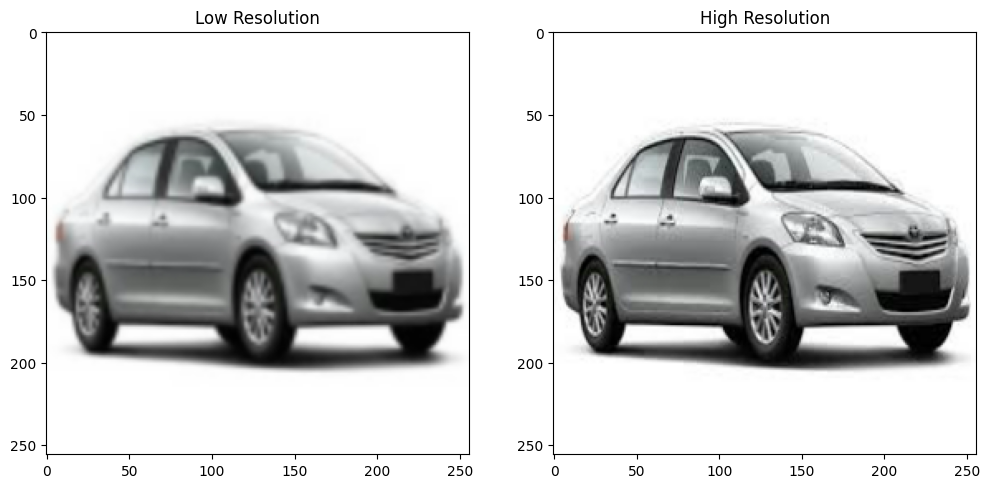

Shape of y_low[7]: torch.Size([1, 256, 256])
Shape of y_high[7]: torch.Size([1, 256, 256])


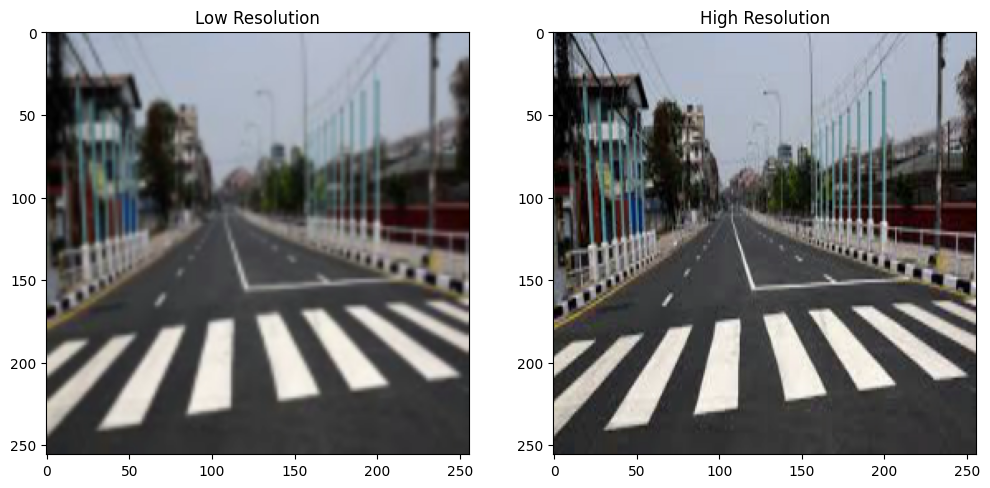

In [12]:
test_dataloader(trainDataLoader, "train_loader")

Testing val_loader: 
Shape of y_low[0]: torch.Size([1, 256, 256])
Shape of y_high[0]: torch.Size([1, 256, 256])


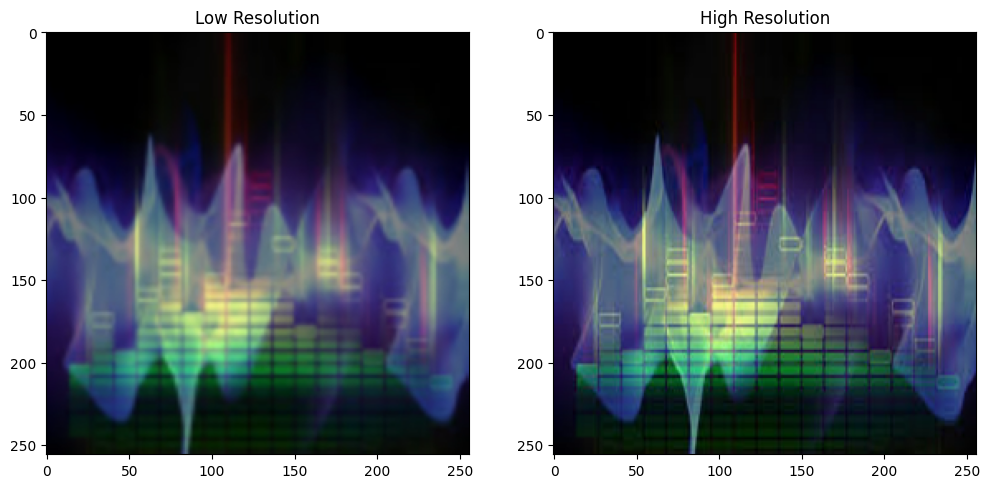

Shape of y_low[1]: torch.Size([1, 256, 256])
Shape of y_high[1]: torch.Size([1, 256, 256])


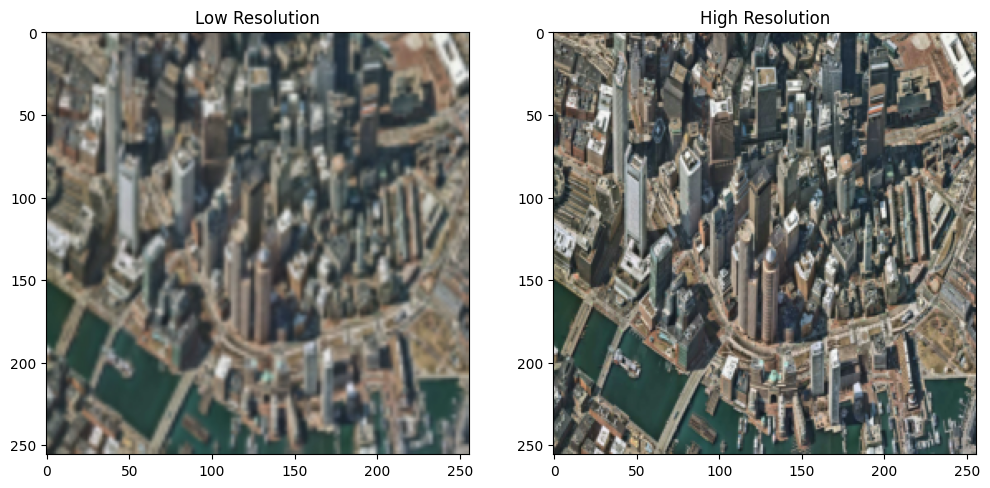

Shape of y_low[2]: torch.Size([1, 256, 256])
Shape of y_high[2]: torch.Size([1, 256, 256])


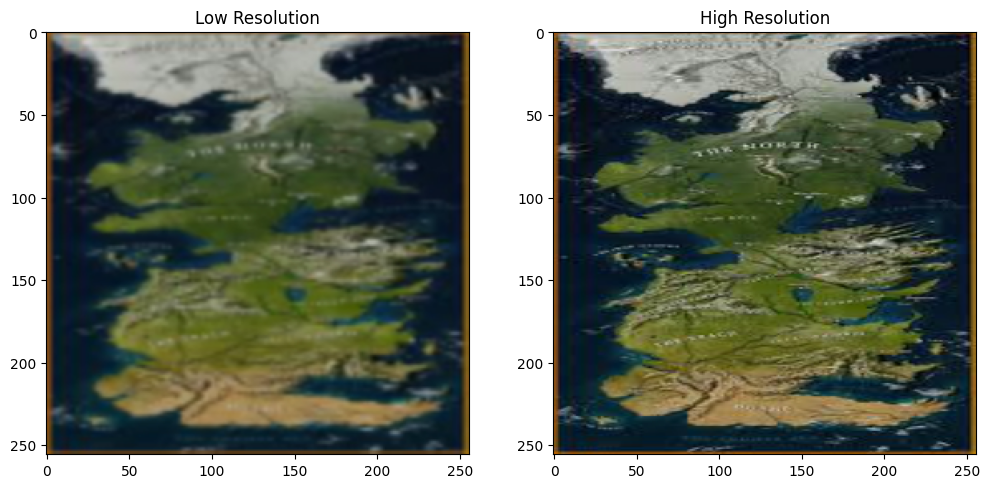

Shape of y_low[3]: torch.Size([1, 256, 256])
Shape of y_high[3]: torch.Size([1, 256, 256])


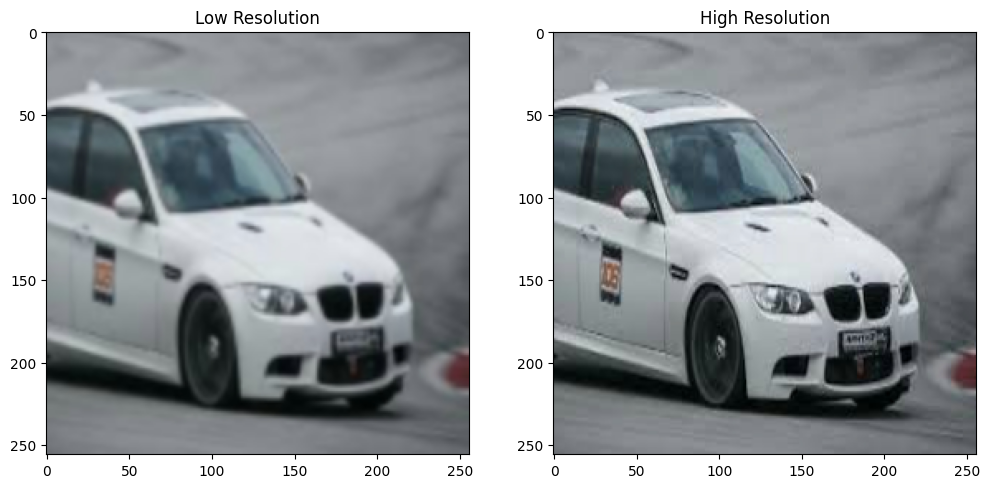

Shape of y_low[4]: torch.Size([1, 256, 256])
Shape of y_high[4]: torch.Size([1, 256, 256])


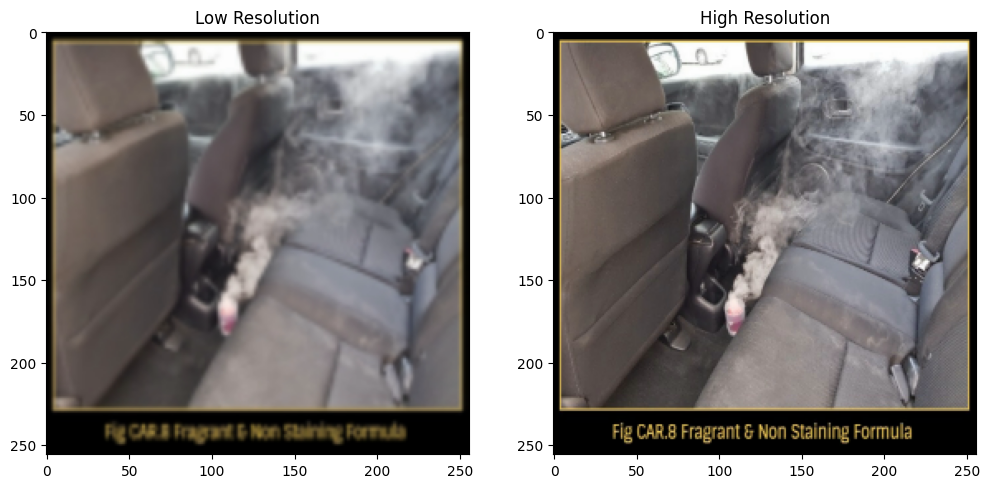

Shape of y_low[5]: torch.Size([1, 256, 256])
Shape of y_high[5]: torch.Size([1, 256, 256])


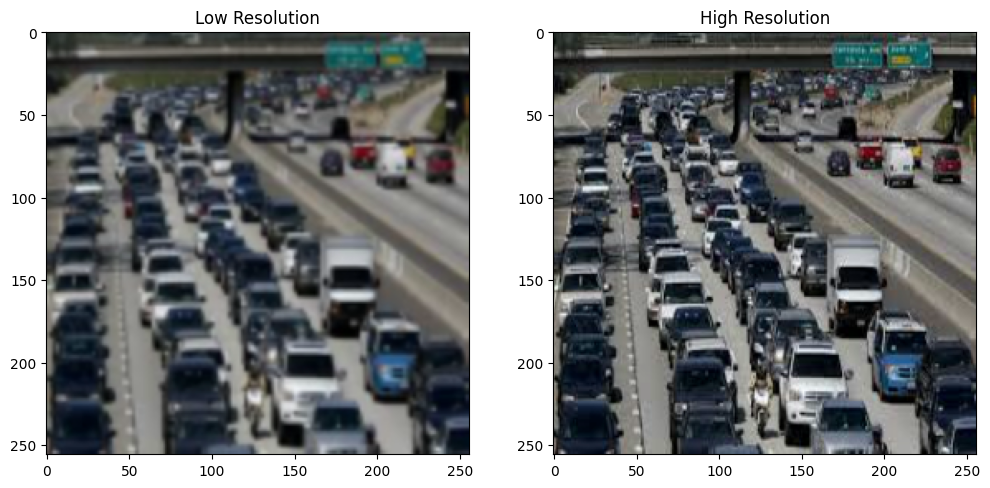

Shape of y_low[6]: torch.Size([1, 256, 256])
Shape of y_high[6]: torch.Size([1, 256, 256])


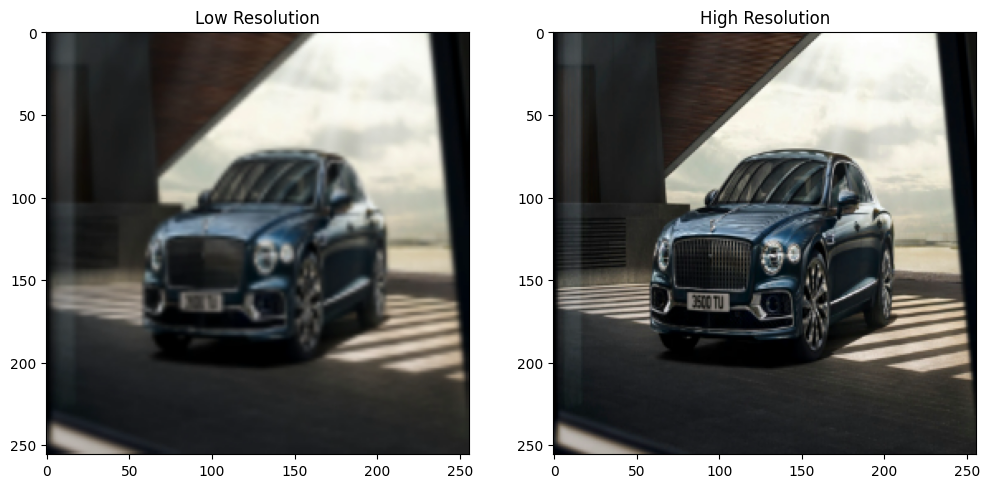

Shape of y_low[7]: torch.Size([1, 256, 256])
Shape of y_high[7]: torch.Size([1, 256, 256])


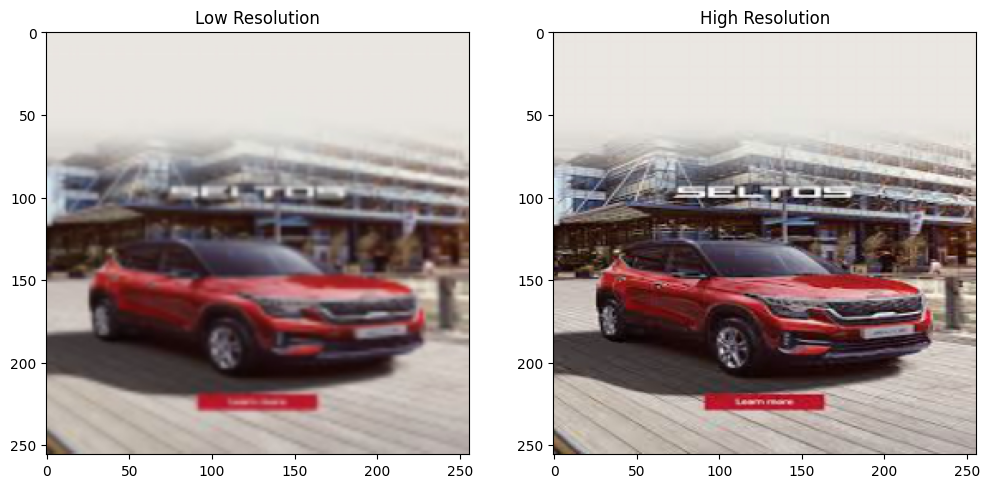

In [13]:
test_dataloader(valDataLoader, "val_loader")

In [21]:
NUM_EPOCHS = 20

import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np


def psnr(img1, img2):
    mse = ((img1 - img2) ** 2).mean()
    if mse == 0:
        return float('inf')
    return 20 * np.log10(1.0 / np.sqrt(mse))


# Training function
def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=NUM_EPOCHS):

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)
    
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        running_psnr = 0.0

        for y_low, y_high, _, _, _, _ in train_loader:
            y_low, y_high = y_low.to(device), y_high.to(device)

            optimizer.zero_grad()
            outputs = model(y_low)
            loss = criterion(outputs, y_high)

            loss.backward()
            optimizer.step()

            running_loss += loss.item() * y_low.size(0)
            running_psnr += psnr(outputs.cpu().detach().numpy(), y_high.cpu().detach().numpy()) * y_low.size(0)

        epoch_loss = running_loss / len(train_loader.dataset)
        epoch_psnr = running_psnr / len(train_loader.dataset)

        model.eval()
        val_loss = 0.0
        val_psnr = 0.0
        with torch.no_grad():
            for y_low, y_high, _, _, _, _ in val_loader:
                y_low, y_high = y_low.to(device), y_high.to(device)

                outputs = model(y_low)
                loss = criterion(outputs, y_high)

                val_loss += loss.item() * y_low.size(0)
                val_psnr += psnr(outputs.cpu().numpy(), y_high.cpu().numpy()) * y_low.size(0)

        val_loss /= len(val_loader.dataset)
        val_psnr /= len(val_loader.dataset)

        print(f'Epoch {epoch+1}/{num_epochs}, '
              f'Train Loss: {epoch_loss:.4f}, Train PSNR: {epoch_psnr:.4f}, '
              f'Val Loss: {val_loss:.4f}, Val PSNR: {val_psnr:.4f}')

    print('Training complete')
    return model

In [22]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_SRCNN = model_SRCNN.to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(model_SRCNN.parameters(), lr=0.001)

In [16]:
model_SRCNN

SRCNN(
  (conv1): Conv2d(1, 64, kernel_size=(9, 9), stride=(1, 1), padding=(4, 4))
  (conv2): Conv2d(64, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (conv3): Conv2d(32, 1, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (relu): ReLU(inplace=True)
)

In [23]:
model_SRCNN = train_model(model_SRCNN, trainDataLoader, valDataLoader, criterion, optimizer)

Epoch 1/20, Train Loss: 0.0032, Train PSNR: 27.5898, Val Loss: 0.0010, Val PSNR: 29.9893
Epoch 2/20, Train Loss: 0.0010, Train PSNR: 30.2510, Val Loss: 0.0010, Val PSNR: 30.2702
Epoch 3/20, Train Loss: 0.0009, Train PSNR: 30.4218, Val Loss: 0.0010, Val PSNR: 30.1605
Epoch 4/20, Train Loss: 0.0010, Train PSNR: 30.1772, Val Loss: 0.0009, Val PSNR: 30.4518
Epoch 5/20, Train Loss: 0.0009, Train PSNR: 30.5249, Val Loss: 0.0009, Val PSNR: 30.4417
Epoch 6/20, Train Loss: 0.0009, Train PSNR: 30.5504, Val Loss: 0.0009, Val PSNR: 30.4892
Epoch 7/20, Train Loss: 0.0009, Train PSNR: 30.4546, Val Loss: 0.0009, Val PSNR: 30.3505
Epoch 8/20, Train Loss: 0.0009, Train PSNR: 30.4912, Val Loss: 0.0009, Val PSNR: 30.4869
Epoch 9/20, Train Loss: 0.0009, Train PSNR: 30.4421, Val Loss: 0.0009, Val PSNR: 30.4603
Epoch 10/20, Train Loss: 0.0009, Train PSNR: 30.5879, Val Loss: 0.0009, Val PSNR: 30.5178
Epoch 11/20, Train Loss: 0.0009, Train PSNR: 30.6471, Val Loss: 0.0009, Val PSNR: 30.5205
Epoch 12/20, Train 

In [31]:
train_low_res_dir = '/kaggle/input/image-super-resolution/dataset/train/low_res'
train_high_res_dir = '/kaggle/input/image-super-resolution/dataset/train/high_res'
output_dir_finetuned = '/kaggle/working/upscaled_images_finetuned'
val_low_res_dir = '/kaggle/input/image-super-resolution/dataset/val/low_res'
val_high_res_dir = '/kaggle/input/image-super-resolution/dataset/val/high_res'
output_dir_finetuned = '/kaggle/working/upscaled_images_finetuned'

os.makedirs(output_dir, exist_ok=True)

Processed 641.png


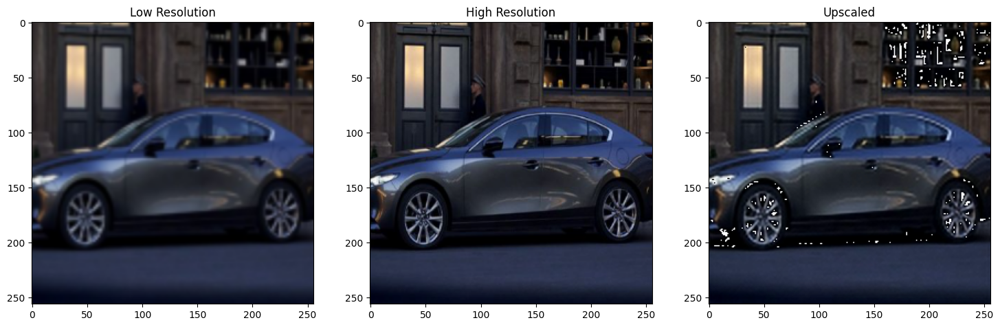

Processed 173.png


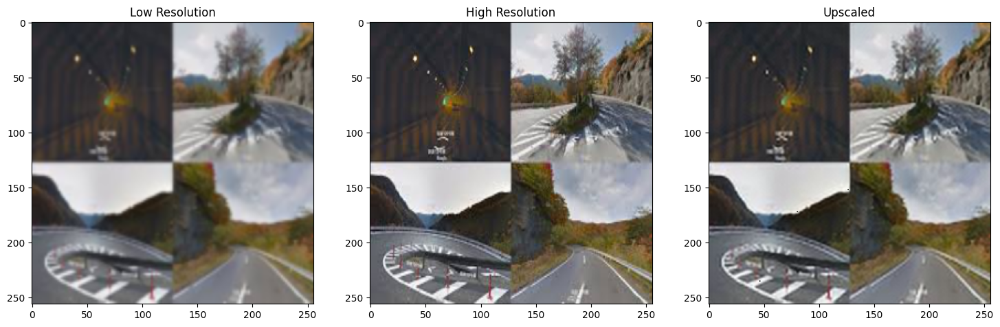

Processed 491.png


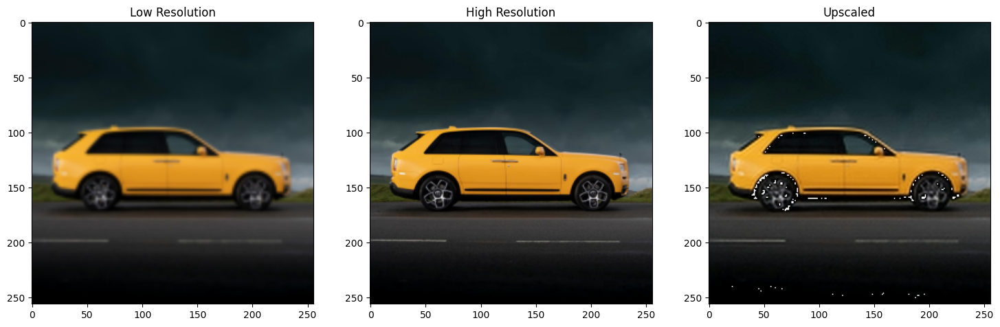

Processed 379.png


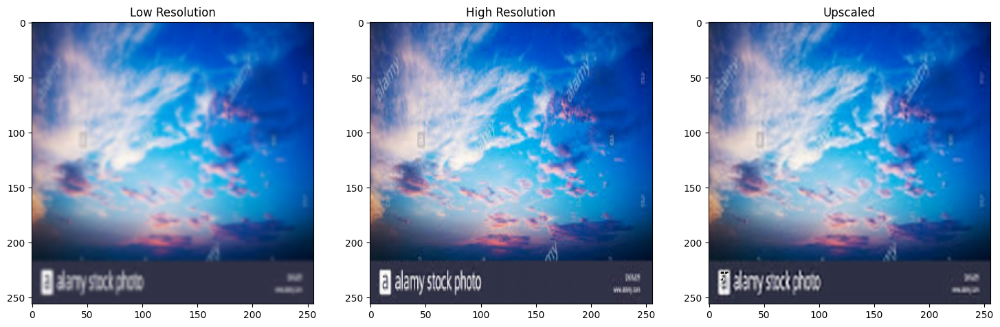

Processed 248.png


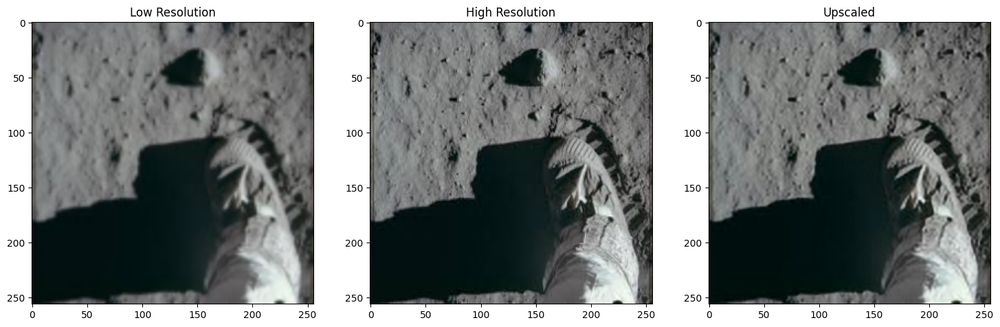

Processed 94.png


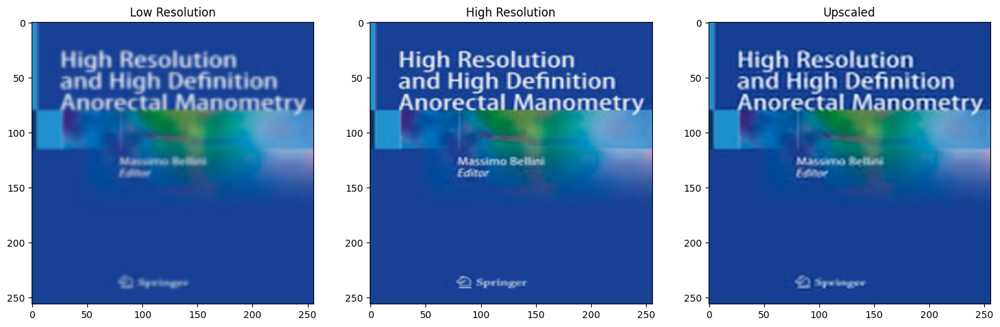

Processed 480.png


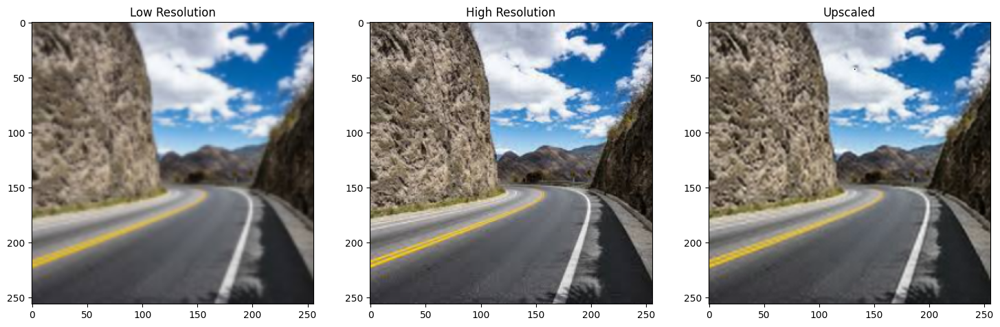

Processed 236.png


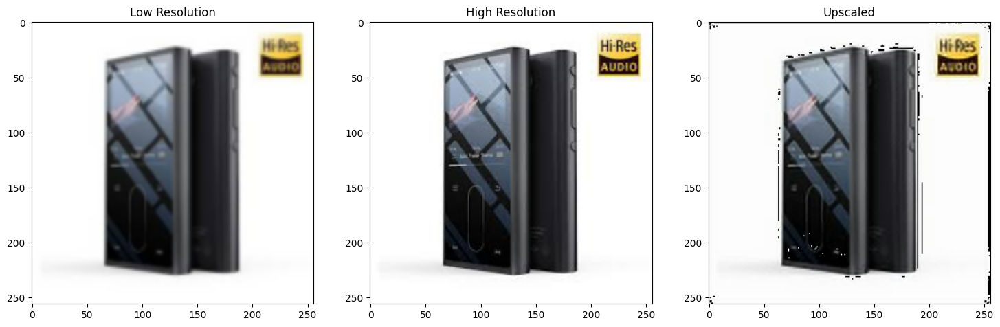

Processed 675.png


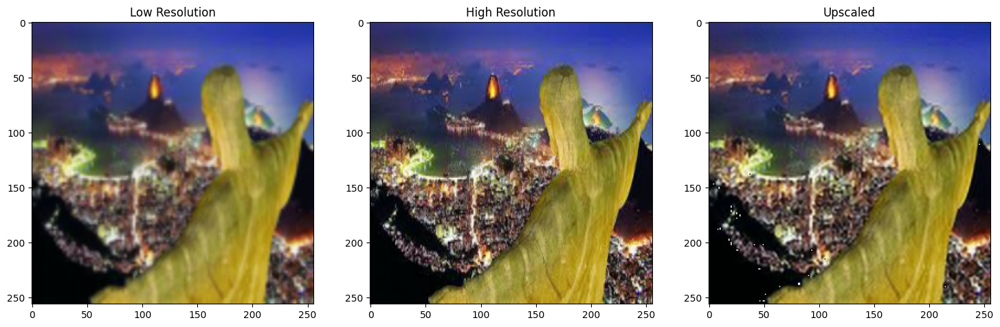

Processed 340.png


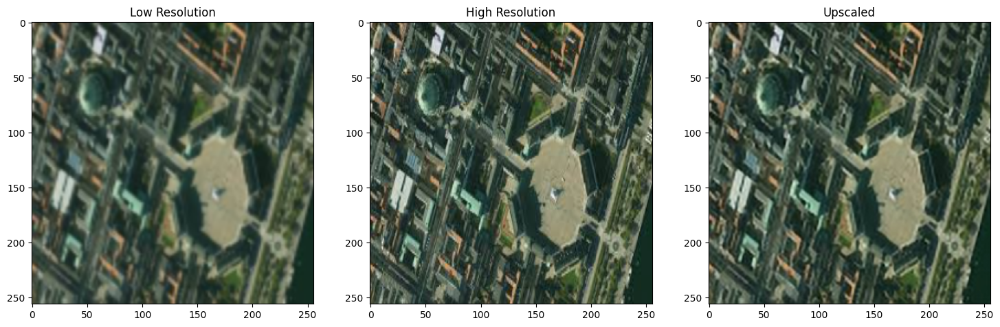

In [32]:
process_and_display_image(model_SRCNN, train_low_res_dir, train_high_res_dir, output_dir_finetuned, num_images_to_process=10)